<a href="https://colab.research.google.com/github/radenariq/PCVK_Ganjil_2024-2025/blob/main/week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**RADEN ARIQ RESYA ALAUDDINE / TI-3D**

**MODUL 5 – Operasi Aritmatika dan Logika - Gamma Correction,
Image Depth, PSNR, Average Denoising, Image Masking**

1. Buat Gamma Correction sesuai dengan petunjuk berikut

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


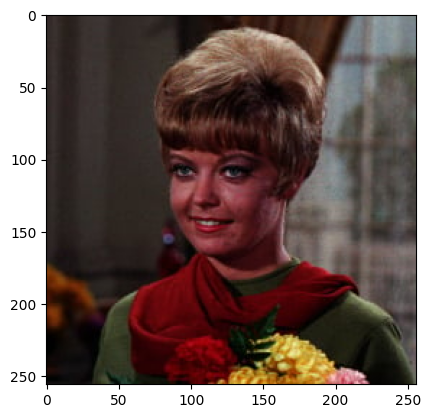

In [14]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img_bgr = cv.imread('/content/drive/MyDrive/images/female.tiff')
img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
plt.imshow(img)

In [15]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


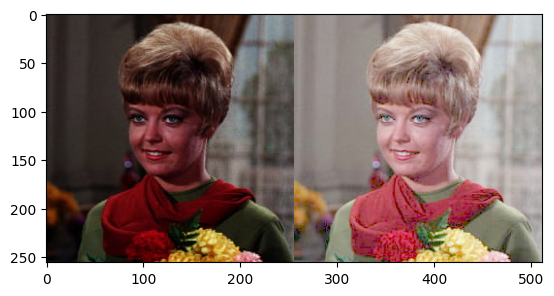

In [16]:
# l' = 255(l\255)^1/y

img_corrected = np.uint8(255 * np.power(img / 255, 1 / gamma));

plt.imshow(cv.hconcat((img, img_corrected)))

2. Buat Simulasi Image Depth

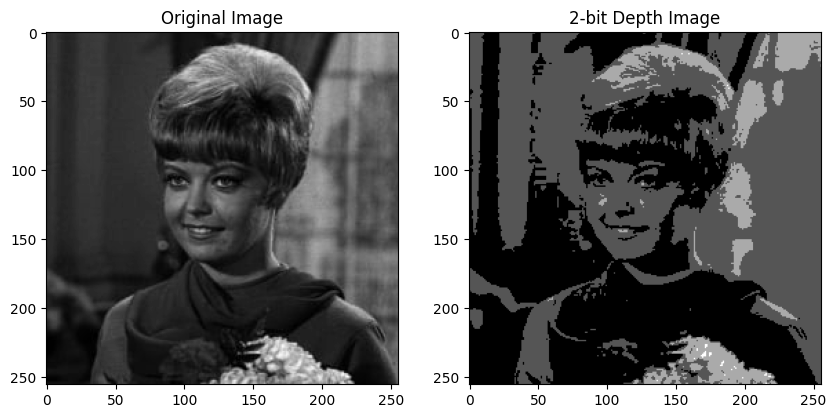

In [36]:
# Bit depth dan level
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)

# Membaca gambar dan membuat citra dengan kedalaman tertentu
original = cv.imread('/content/drive/MyDrive/images/female.tiff', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

# Mengakses tiap piksel dan menerapkan kuantisasi
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        depth_image[y, x] = round(original[y, x] / level) * level

# Gabungkan hasil gambar untuk ditampilkan
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(original, cmap='gray')
ax[0].set_title('Original Image')
ax[1].imshow(depth_image, cmap='gray')
ax[1].set_title(f'{bit_depth}-bit Depth Image')
plt.show()

3. Buat modul Average Denoising

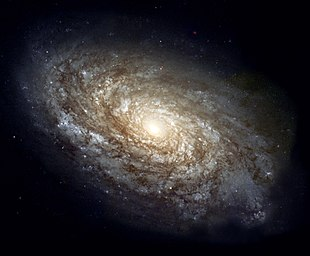

5 images
psnr modul: 100
psnr cv: 361.20199909921956


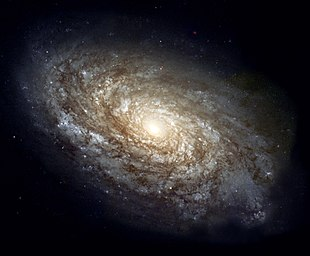

10 images
psnr modul: 100
psnr cv: 361.20199909921956


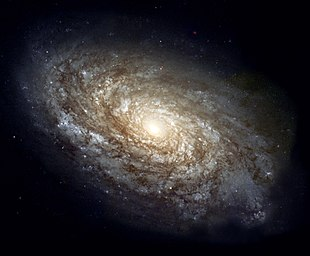

20 images
psnr modul: 100
psnr cv: 361.20199909921956


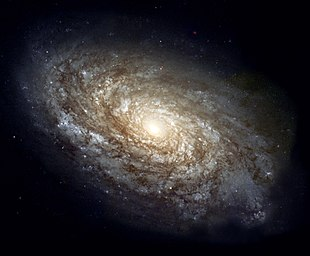

40 images
psnr modul: 100
psnr cv: 361.20199909921956


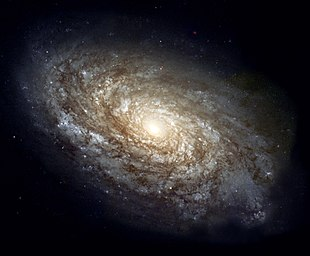

80 images
psnr modul: 100
psnr cv: 361.20199909921956


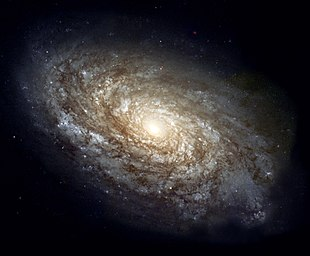

100 images
psnr modul: 100
psnr cv: 361.20199909921956


In [32]:
import glob

cv_img = []
for img in glob.glob('/content/drive/MyDrive/images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

galaxy = cv.imread('/content/drive/MyDrive/images/galaxy.jpg')

cv_img = np.array(cv_img)

avg_5 = np.uint8(np.mean(cv_img[:5], axis=0))

from math import log10, sqrt

def PSNR(img1, img2):
  mse = np.mean((img1 - img2) ** 2)
  if(mse == 0): # MSE 0 maka tidak ada noise sam a sekali, sehingga PSNR tidak memiliki arti
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

avgs = [5, 10, 20, 40, 80, 100]

for i in avgs:
  avg = np.uint8(np.mean(cv_img[:i], axis=0))
  psnr = PSNR(galaxy, avg)
  psnrcv = cv.PSNR(galaxy, avg)
  cv2_imshow(avg)
  print(f"{i} images\npsnr modul: {psnr}\npsnr cv: {psnrcv}")

  dengan bertambahnya jumlah gambar yang digunakan untuk perhitungan rata-rata, kualitas gambar hasil akan semakin baik, yang diindikasikan dengan peningkatan nilai PSNR. Teknik rata-rata adalah metode yang efektif untuk mengurangi noise, terutama ketika tersedia banyak gambar dengan karakteristik noise yang berbeda-beda

4. Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP), sedangkan image paling kanan adalah hasilnya:

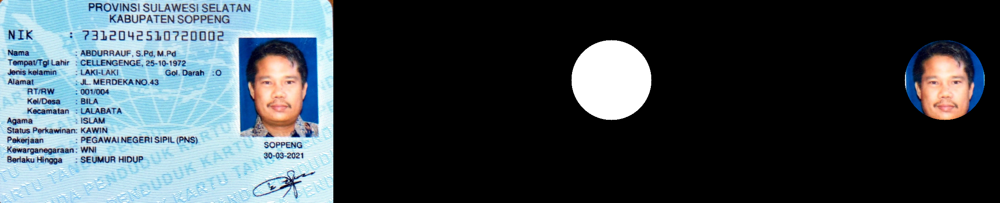

In [37]:
path='/content/drive/MyDrive/images/KTP7.jpeg'
KTP = cv.imread(path)
mask = np.zeros_like(KTP)

center1 = (667, 192)
radius1 = 96

cv.circle(mask, center1, radius1, (255, 255, 255), -1)
masked_image = cv.bitwise_and(KTP, mask)

final_frame = cv.hconcat((KTP,mask,masked_image))
cv2_imshow(final_frame)

5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini. Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

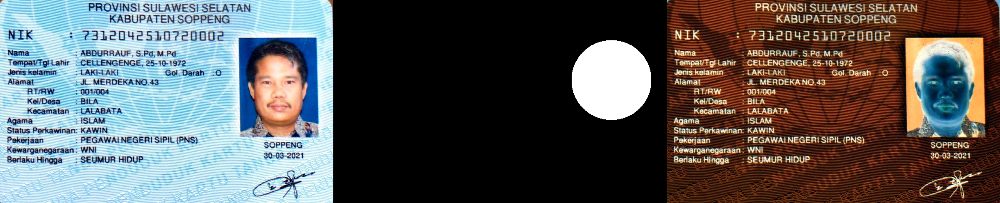

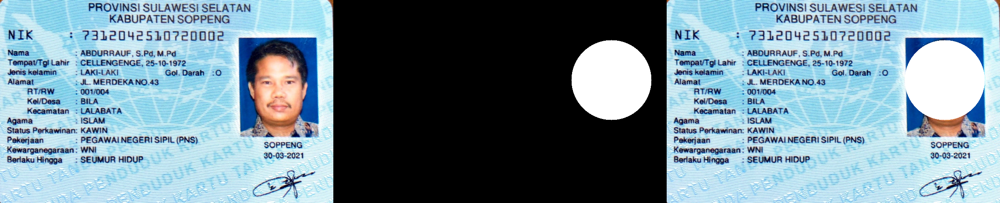

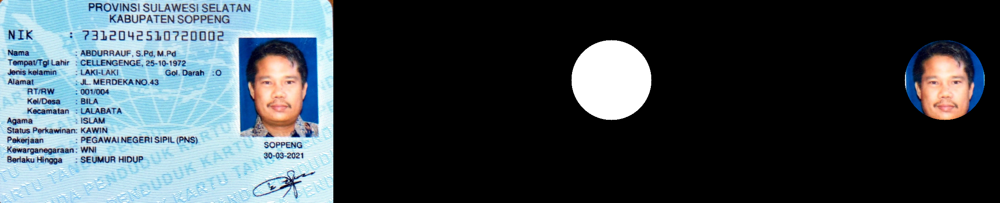

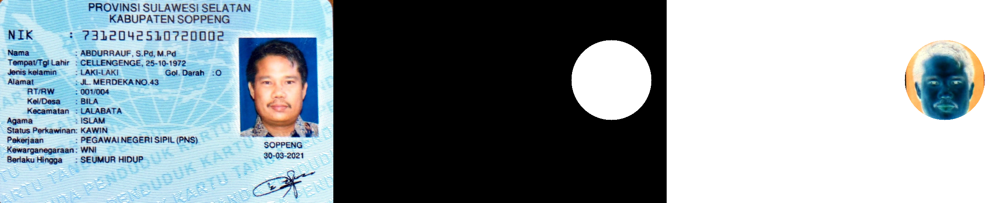

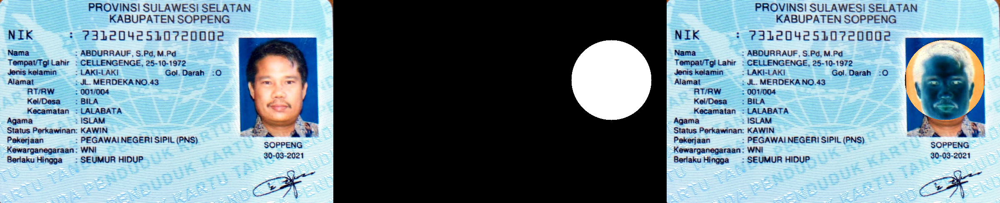

In [38]:
# not, or, and, nand, xor

inot = ~KTP
ior = KTP | mask
iand = KTP & mask
inand = ~(KTP & mask)
ixor = KTP ^ mask

cv2_imshow(cv.hconcat((KTP, mask, inot)))
cv2_imshow(cv.hconcat((KTP, mask, ior)))
cv2_imshow(cv.hconcat((KTP, mask, iand)))
cv2_imshow(cv.hconcat((KTP, mask, inand)))
cv2_imshow(cv.hconcat((KTP, mask, ixor)))

Analisis Hasil:

1. NOT (~):

- Hasil: Citra output akan menjadi negatif dari citra asli KTP. Setiap piksel akan dibalik, sehingga area yang gelap menjadi terang, dan yang terang menjadi gelap.
Analisis: Ini terjadi karena setiap nilai piksel dibalik. Misalnya, nilai 0 diubah menjadi 255, dan 255 menjadi 0.

2. OR (|):

- Hasil: Citra hasil akan menjadi lebih terang dibandingkan kedua input, karena OR cenderung menggabungkan nilai dari kedua gambar. Jika salah satu citra memiliki piksel yang terang, hasil OR juga akan terang.
Analisis: Operasi OR menghasilkan 1 jika salah satu piksel bernilai 1, jadi banyak area akan menjadi lebih terang karena piksel dari mask atau KTP yang tidak 0.

3. AND (&):

- Hasil: Citra hasil akan lebih gelap karena AND hanya mengembalikan 1 jika kedua piksel bernilai tinggi (mendekati 255) pada posisi yang sama.
Analisis: Operasi AND menghasilkan nilai yang lebih rendah kecuali kedua citra memiliki piksel yang sama-sama terang. Ini mengakibatkan banyak area menjadi gelap.

4. NAND (~(A & B)):

- Hasil: Citra hasil lebih terang, karena NAND membalik hasil dari operasi AND.
Analisis: Operasi NAND membalik piksel AND, sehingga banyak area yang gelap pada hasil AND menjadi terang pada hasil NAND.

5. XOR (^):

- Hasil: Citra hasil akan menyoroti perbedaan antara KTP dan mask. Piksel yang sama di kedua citra akan menghasilkan nilai 0 (gelap), sementara piksel yang berbeda akan menjadi terang.
Analisis: XOR digunakan untuk mendeteksi perbedaan antara dua gambar. Piksel yang sama antara KTP dan mask akan dihapus (gelap), dan perbedaan akan tampak terang.